# Raster data preparations

In this exercise, the raster data for the classification excercises is prepared. For machine learning tasks, the input raster data must follow these rules.

1) Data and labels images must have the same:
* Coordinate system
* Resolution / pixel size
* Data origin (min x and y), so that one pixel in both files covers exactly the same area.

2) Labels image must be a raster image of type Integer and 1 band. The class numbers start from 0 and grow to `number_of_classes - 1`. So for binary classification the labels image has values 0 and 1. For 5 class multiclass labels, values 0 to 4. If needed, vector labels need to be rasterized.

3) Data image must be of type Float with values between 0 and 1 (sometimes -1 to 1), should have several bands.

(Here we prepare labels for all data image area, for pixel-wise machine learning, data could be prepared also in some other way.)

## Data sources

#### Labels:
All data downloaded from [GeoPortti GeoCubes](https://vm0160.kaj.pouta.csc.fi/geocubes/)
* Finnish Food Authority, [Agricultural parcel](https://www.paikkatietohakemisto.fi/geonetwork/srv/eng/catalog.search#/metadata/e4467d0b-51f9-41f2-bd7e-8ff48a2cb083)
* LUKE, [MVMI Stand basal area ](https://kartta.luke.fi/index-en.html)
* SYKE, [CORINE](https://www.paikkatietohakemisto.fi/geonetwork/srv/eng/catalog.search#/metadata/%7B0B4B2FAC-ADF1-43A1-A829-70F02BF0C0E5%7D)

The advantage of useing GeoCubes is that there all data is pre-processed so that it fits the requirements mentioned above. Agricultural parcels have been rasterized.

#### Data image:

* FMI, [10-days Sentinel2 mosaic](https://ckan.ymparisto.fi/dataset/sentinel-2-satellite-image-mosaics-s2gm-sentinel-2-satelliittikuvamosaiikki-s2gm), original images from ESA.

All datasets used for this exercise have already same coordinate system, resolution and data origin, so do not need to fix these here.

## Data processing results

The goal of this exercise is to have 3 raster files:

* Coordinate system: Finnish ETRS-TM35FIN, EPSG:3067
* Resolution: 20m
* BBOX: 200000, 6700000, 300000, 6800000

#### Labels

* Binary classification raster: 1 - forest, 0 - everything else.
* Multiclass classification raster: 1 - forest, 2 - fields, 3 - water, 4 - urban, 0 - everything else.

#### Data image

* Sentinel2 mosaic, we include data from 2 different dates (May and July), to have more data values. Final dataset has 8 bands based on bands: 2, 3, 4 and 8 on dates: 2021-05-11 and 2021-07-21, reflection values scaled to [0 ... 1]. The bands source data is: 
     *  'b02' / '2021-05-11'
     *  'b02' / '2021-07-21'
     *  'b03' / '2021-05-11'
     *  'b03' / '2021-07-21'
     *  'b04' / '2021-05-11'
     *  'b04' / '2021-07-21'
     *  'b08' / '2021-05-11'
     *  'b08' / '2021-07-21'

## Data processing main steps

#### Labels

1) Read data
2) Create a new dataset for forest class only and save it as file.
3) Add other classes to the new dataset and save it as file.
4) Remove clutter - areas with only few pixels of class x are reclassified to bigger area around them.

#### Data image

1) (Find data using FMI STAC catalogue.)
2) Create a data stack, including only required bands
3) Normalize the data values, the reflectance values are originally between 0 and 1, but for storage they have been multiplied with 10 000, so here the normalization is simple division with 10 000.
4) Stack different data from different dates just as bands.
5) Save the file.

This workbook requires at least 8Gb memory. 1 core is enough.

## Imports and paths

Below rasterio is used for labels data and xarray for data image.

In [1]:
import rasterio
import numpy as np
from rasterio.plot import show
from rasterio.plot import show_hist
import matplotlib.pyplot as plt
from pystac import Catalog, Collection, Item
import pystac_client
import stackstac
import rioxarray
import xarray

Set file names:
* Data URLs for GeoCube are found from here: https://vm0160.kaj.pouta.csc.fi/geocubes/fileaccess/
* Data URLs for STAC items are found from the main catalogue. Visual search of less cloudy days: https://tuulituhohaukka.out.ocp.fmi.fi/

In [2]:
# URLs for labels
fields_url = '/vsicurl/https://vm0160.kaj.pouta.csc.fi/mavi/peltolohkot/2016/peltolohkot_2016_200000_6800000_20m.tif'
corine_url = '/vsicurl/https://vm0160.kaj.pouta.csc.fi/syke/corine/2018/corine_2018_200000_6800000_20m.tif'
forest_url = '/vsicurl/https://vm0160.kaj.pouta.csc.fi/luke/MVMI/ppa/2015/mvmi-ppa_2015_200000_6800000_20m.tif'

# URLs for data image
stac_url = 'https://pta.data.lit.fmi.fi/stac/catalog/Sentinel-2_global_mosaic_dekadi/Sentinel-2_global_mosaic_dekadi.json'
stac_item1 = 'https://pta.data.lit.fmi.fi/stac/items/Sentinel-2_global_mosaic_dekadi/Sentinel-2_global_mosaic_dekadi_2021-05-11_2021-05-20.json'
stac_item2 = 'https://pta.data.lit.fmi.fi/stac/items/Sentinel-2_global_mosaic_dekadi/Sentinel-2_global_mosaic_dekadi_2021-07-21_2021-07-31.json'

# Results paths, temporary files are saved in working directory, results in the root folder.
multiclass_labels_to_generalize_file = 'labels_multiclass_to_generalize.tif'
multiclass_labels_file_final = '../labels_multiclass.tif'
forest_labels_to_generalize_file = 'labels_forest_to_generalize.tif'
forest_labels_file_final = '../labels_forest.tif'
image_file = '../image.tif'

## Labels processing

1) Read data and plot it.

In [3]:
with rasterio.open(fields_url) as fields_src:
    fields_data = fields_src.read(1)
    
with rasterio.open(corine_url) as corine_src:
    corine_data = corine_src.read(1)
        
with rasterio.open(forest_url) as forest_src:
    forest_data = forest_src.read(1)    

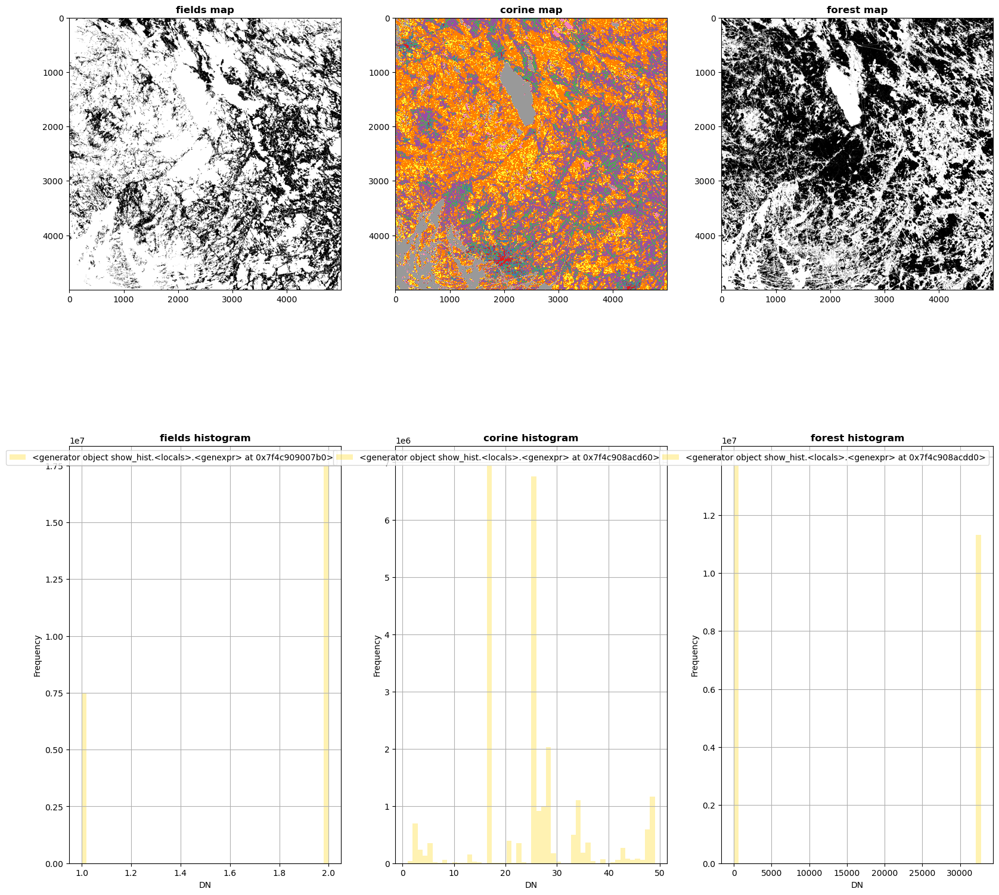

In [4]:
### Create a subplot
fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(20, 20))

show(fields_data, ax=ax[0, 0], cmap='Greys_r', title='fields map')
show_hist(fields_data, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', ax=ax[1, 0], title="fields histogram")

show(corine_data, ax=ax[0, 1], cmap='Set1', title='corine map')
show_hist(corine_data, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', ax=ax[1, 1], title="corine histogram")
show(forest_data, ax=ax[0, 2], cmap='Greys_r', title='forest map')
show_hist(forest_data, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', ax=ax[1, 2], title="forest histogram")


In [5]:
# Alternative option to see data distribution
#print("Fields data:")
#print(np.unique(fields_data, return_counts=True))
#print("Forest data:")
#print(np.unique(forest_data, return_counts=True))
#print("CORINE data:")
#print(np.unique(corine_data, return_counts=True))

2) Create a new dataset for forest class only and save it as file.

In [6]:
labels_data = np.full_like(fields_data, 0) #Other
labels_data[forest_data < 50] = 1 # Forest

In [7]:
# Write data to file.
# Read metadata of first file and adjust it for this output
with rasterio.open(fields_url) as src0:
    labels_meta = src0.meta
    labels_meta["nodata"] = 100
    
with rasterio.open(forest_labels_to_generalize_file, 'w', compress="DEFLATE", **labels_meta) as single_class_dst:
    single_class_dst.write_band(1, labels_data)

3) Add other classes to the new dataset and save it as file.

In [8]:
labels_data[fields_data == 1] = 2 # Fields
labels_data[corine_data == 47] = 3 # Rivers
labels_data[corine_data == 48] = 3 # Lakes
labels_data[corine_data == 49] = 3 # Sea
labels_data[corine_data <= 11] = 4 # Different urban areas

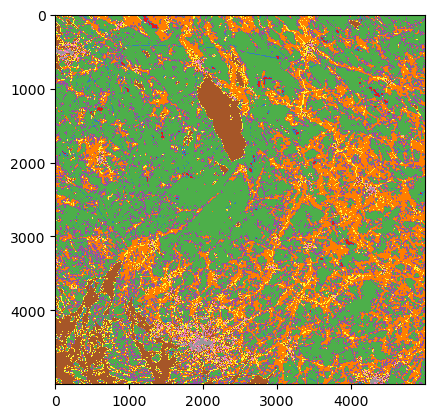

<AxesSubplot:>

In [9]:
show(labels_data, cmap='Set1')

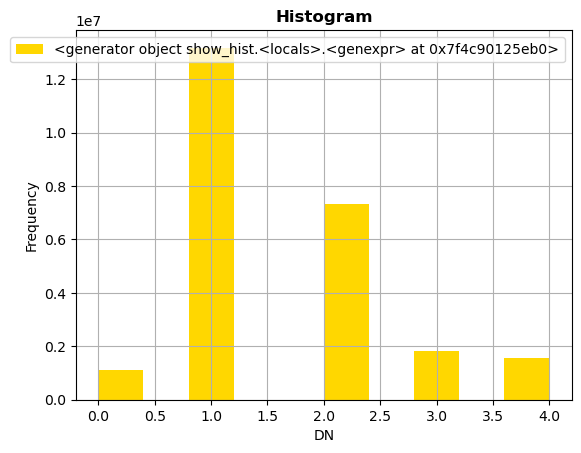

In [10]:
show_hist(labels_data)

In [11]:
# Write to file.
with rasterio.open(multiclass_labels_to_generalize_file, 'w', compress="DEFLATE", **labels_meta) as multiclass_dst:
    multiclass_dst.write_band(1, labels_data)

4) Remove clutter - areas with only few pixels of class x are reclassified to bigger area around them. [GDAL Sieve tool](https://gdal.org/programs/gdal_sieve.html) helps to do it without coding. For single class and multiple class cases.

In [12]:
# https://gdal.org/programs/gdal_sieve.html#gdal-sieve
!gdal_sieve.py -st 30 {multiclass_labels_to_generalize_file} {multiclass_labels_file_final} 

0...10...20...30...40...50...60...70...80...90...100 - done.


In [13]:
# https://gdal.org/programs/gdal_sieve.html#gdal-sieve
!gdal_sieve.py -st 30 {forest_labels_to_generalize_file} {forest_labels_file_final} 

0...10...20...30...40...50...60...70...80...90...100 - done.


Double-check that all looks good.

In [14]:
!gdalinfo {multiclass_labels_file_final} -hist

Driver: GTiff/GeoTIFF
Files: ../labels_multiclass.tif
Size is 5000, 5000
Coordinate System is:
PROJCRS["ETRS89 / TM35FIN(E,N)",
    BASEGEOGCRS["ETRS89",
        ENSEMBLE["European Terrestrial Reference System 1989 ensemble",
            MEMBER["European Terrestrial Reference Frame 1989"],
            MEMBER["European Terrestrial Reference Frame 1990"],
            MEMBER["European Terrestrial Reference Frame 1991"],
            MEMBER["European Terrestrial Reference Frame 1992"],
            MEMBER["European Terrestrial Reference Frame 1993"],
            MEMBER["European Terrestrial Reference Frame 1994"],
            MEMBER["European Terrestrial Reference Frame 1996"],
            MEMBER["European Terrestrial Reference Frame 1997"],
            MEMBER["European Terrestrial Reference Frame 2000"],
            MEMBER["European Terrestrial Reference Frame 2005"],
            MEMBER["European Terrestrial Reference Frame 2014"],
            ELLIPSOID["GRS 1980",6378137,298.257222101,
   

Clean up, to decrease memory needs.

In [15]:
fields_src.close()
corine_src.close()
forest_src.close()
multiclass_dst.close()
single_class_dst.close()
del fields_data, corine_data, labels_data, forest_data

## Data image processing

1. Find data using FMI STAC catalogue. For longer intro to STAC and its usege see [CSC STAC examples](https://github.com/csc-training/geocomputing/tree/master/python/STAC).

In [16]:
# Because it takes a while to download all metadata from catalogue, we skip it here and instead use direct links to 2 STAC items.
# But if looking for data from different time or place, this could be used.

# collection = Collection.from_file('https://pta.data.lit.fmi.fi/stac/catalog/Sentinel-2_global_mosaic_dekadi/Sentinel-2_global_mosaic_dekadi.json')
# items = list(collection.get_all_items())

In [17]:
# Load directly 2 mosaic items, that means that we have also selected 2 time periods.
item_may = Item.from_file(stac_item1)
item_july = Item.from_file(stac_item2)
items = [item_may, item_july]

In [18]:
# See what data is available for each item.
print(f"Number of items: {len(items)}")

for i, item in enumerate(items[:1]):
    print(f"{i}: {item}", flush=True)
    print(f"{i}: {item.bbox}", flush=True)
    print(f"{i}: {item.properties}", flush=True)
    print(f"{i}: {item.assets}", flush=True)

Number of items: 2
0: <Item id=Sentinel-2_global_mosaic_dekadi_2021-05-11_2021-05-20>
0: [15.201371090979, 59.1420203584345, 36.0214759928302, 70.0770184416577]
0: {'datetime': None, 'start_datetime': '2021-05-11T00:00:00Z', 'end_datetime': '2021-05-20T23:59:59Z'}
0: {'b01': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b01/s2m_sdr_20210511-20210520_b01_r20m.tif>, 'b02': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b02/s2m_sdr_20210511-20210520_b02_r20m.tif>, 'b03': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b03/s2m_sdr_20210511-20210520_b03_r20m.tif>, 'b04': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b04/s2m_sdr_20210511-20210520_b04_r20m.tif>, 'b05': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b05/s2m_sdr_20210511-20210520_b05_r20m.tif>, 'b06': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b06/s2m_sdr_20210511-20210520_b06_r20m.tif>, 'b07': <Asset href=https://pta.data.lit.fmi.fi/sen2/s2m_b07/s2m_sdr_20210511-20210520_b07_r20m.tif>, 'b08': <Asset href=https

2) Create a data stack, including only required bands.

In [19]:
cube = stackstac.stack(
    items=[item.to_dict() for item in items],    
    assets=['b02', 'b03', 'b04', 'b08'],
    epsg=3067,
    resolution=20,
    bounds=(200000, 6700000, 300000, 6800000)
    #bounds=(240500, 6775500, 253500, 6788500)
).squeeze()
cube

<xarray.DataArray 'stackstac-a9d2d5740672274fe2294bc570f4bfad' (time: 2,
                                                                band: 4,
                                                                y: 5000, x: 5000)>
dask.array<fetch_raster_window, shape=(2, 4, 5000, 5000), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates:
  * time            (time) datetime64[ns] NaT NaT
    id              (time) <U53 'Sentinel-2_global_mosaic_dekadi_2021-05-11_2...
  * band            (band) <U3 'b02' 'b03' 'b04' 'b08'
  * x               (x) float64 2e+05 2e+05 2e+05 ... 2.999e+05 3e+05 3e+05
  * y               (y) float64 6.8e+06 6.8e+06 6.8e+06 ... 6.7e+06 6.7e+06
    end_datetime    (time) <U20 '2021-05-20T23:59:59Z' '2021-07-31T23:59:59Z'
    start_datetime  (time) <U20 '2021-05-11T00:00:00Z' '2021-07-21T00:00:00Z'
    title           (band) <U3 'b02' 'b03' 'b04' 'b08'
    epsg            int64 3067
Attributes:
    spec:        RasterSpec(epsg=3067, bounds=(200000, 6700000, 300000, 68000...
    crs:         epsg:3067
    transform:   | 20.00, 0.00, 200000.00|\n| 0.00,-20.00, 6800000.00|\n| 0.0...
    resolution:  20

3) Normalize the data values, the reflectance values are originally between 0 and 1, but for storage they have been multiplied with 10 000, so here the normalization is simple division with 10 000.

In [20]:
cube_normalized = cube / 10000.0

In [21]:
# Assign start_date as time coordinate, to better be able to use time (plotting, querying).
cube_fixed_coords = cube_normalized.assign_coords(time=np.array(cube.start_datetime.values,dtype=np.datetime64))

# Fix coordinates for datacube. Currently there is a bug in stackstac package, that shifts each pixel half-pixel away from original location.
# Hopefully this will be fixed in stackstac package and will not be needed in long run.
cube_fixed_coords = cube_fixed_coords.assign_coords(x=cube_fixed_coords.x.values + 10)
cube_fixed_coords = cube_fixed_coords.assign_coords(y=cube_fixed_coords.y.values + 10)
cube_fixed_coords

/tmp/ekkylli/13107673/ipykernel_233778/2525491818.py:2: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  cube_fixed_coords = cube_normalized.assign_coords(time=np.array(cube.start_datetime.values,dtype=np.datetime64))


<xarray.DataArray 'stackstac-a9d2d5740672274fe2294bc570f4bfad' (time: 2,
                                                                band: 4,
                                                                y: 5000, x: 5000)>
dask.array<truediv, shape=(2, 4, 5000, 5000), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates:
  * time            (time) datetime64[ns] 2021-05-11 2021-07-21
    id              (time) <U53 'Sentinel-2_global_mosaic_dekadi_2021-05-11_2...
  * band            (band) <U3 'b02' 'b03' 'b04' 'b08'
  * x               (x) float64 2e+05 2e+05 2e+05 ... 3e+05 3e+05 3e+05
  * y               (y) float64 6.8e+06 6.8e+06 6.8e+06 ... 6.7e+06 6.7e+06
    end_datetime    (time) <U20 '2021-05-20T23:59:59Z' '2021-07-31T23:59:59Z'
    start_datetime  (time) <U20 '2021-05-11T00:00:00Z' '2021-07-21T00:00:00Z'
    title           (band) <U3 'b02' 'b03' 'b04' 'b08'
    epsg            int64 3067

In [22]:
# If using full STAC catalogue, select dates, skipped here because we used shortcut to select only 2 days.
# cube_fixed_coords = cube_fixed_coords[(cube_fixed_coords["time"] == np.datetime64('2021-05-11T00:00:00.000000000')) | (cube_fixed_coords["time"] == np.datetime64('2021-07-21T00:00:00.000000000'))]
# cube_fixed_coords

Plot both scens as RGB images.

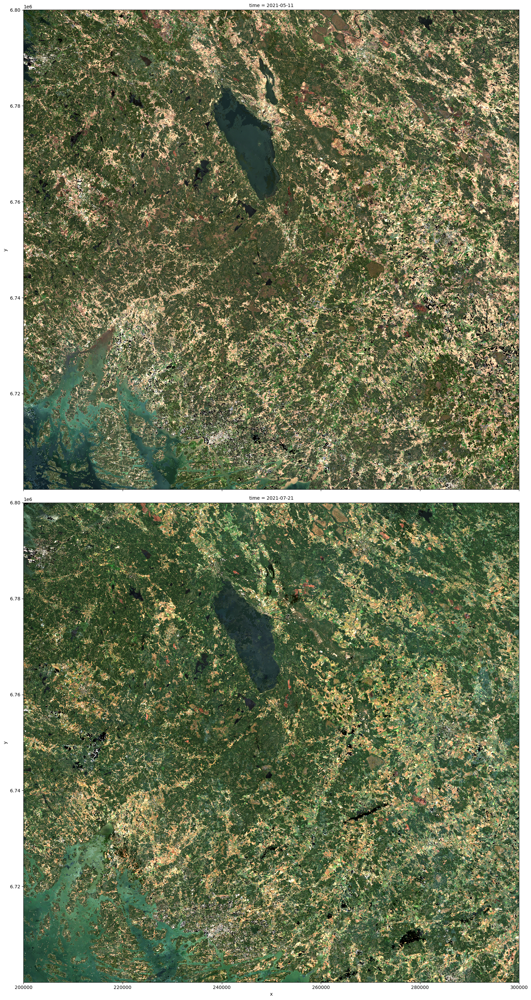

In [23]:
cube_2021_rgb = cube_fixed_coords.sel(band=['b04', 'b03', 'b02'])
cube_2021_rgb.plot.imshow(row="time", rgb="band", robust=True, size=15)

4) Stack different data from different dates just as bands.

In [24]:
stacked = cube_fixed_coords.stack(z=("band", "time"))
stacked

<xarray.DataArray 'stackstac-a9d2d5740672274fe2294bc570f4bfad' (y: 5000,
                                                                x: 5000, z: 8)>
dask.array<reshape, shape=(5000, 5000, 8), dtype=float64, chunksize=(1024, 1024, 2), chunktype=numpy.ndarray>
Coordinates:
    id              (z) <U53 'Sentinel-2_global_mosaic_dekadi_2021-05-11_2021...
  * x               (x) float64 2e+05 2e+05 2e+05 ... 3e+05 3e+05 3e+05
  * y               (y) float64 6.8e+06 6.8e+06 6.8e+06 ... 6.7e+06 6.7e+06
    end_datetime    (z) <U20 '2021-05-20T23:59:59Z' ... '2021-07-31T23:59:59Z'
    start_datetime  (z) <U20 '2021-05-11T00:00:00Z' ... '2021-07-21T00:00:00Z'
    title           (z) <U3 'b02' 'b02' 'b03' 'b03' 'b04' 'b04' 'b08' 'b08'
    epsg            int64 3067
  * z               (z) object MultiIndex
  * band            (z) <U3 'b02' 'b02' 'b03' 'b03' 'b04' 'b04' 'b08' 'b08'
  * time            (z) datetime64[ns] 2021-05-11 2021-07-21 ... 2021-07-21

5) Change the axis order for rasterio.

In [25]:
final = stacked.transpose('z', 'y', 'x')
final.rio.write_crs("epsg:3067", inplace=True)
final

<xarray.DataArray 'stackstac-a9d2d5740672274fe2294bc570f4bfad' (z: 8, y: 5000,
                                                                x: 5000)>
dask.array<transpose, shape=(8, 5000, 5000), dtype=float64, chunksize=(2, 1024, 1024), chunktype=numpy.ndarray>
Coordinates:
    id              (z) <U53 'Sentinel-2_global_mosaic_dekadi_2021-05-11_2021...
  * x               (x) float64 2e+05 2e+05 2e+05 ... 3e+05 3e+05 3e+05
  * y               (y) float64 6.8e+06 6.8e+06 6.8e+06 ... 6.7e+06 6.7e+06
    end_datetime    (z) <U20 '2021-05-20T23:59:59Z' ... '2021-07-31T23:59:59Z'
    start_datetime  (z) <U20 '2021-05-11T00:00:00Z' ... '2021-07-21T00:00:00Z'
    title           (z) <U3 'b02' 'b02' 'b03' 'b03' 'b04' 'b04' 'b08' 'b08'
    epsg            int64 3067
  * z               (z) object MultiIndex
  * band            (z) object 'b02' 'b02' 'b03' 'b03' 'b04' 'b04' 'b08' 'b08'
  * time            (z) datetime64[ns] 2021-05-11 2021-07-21 ... 2021-07-21
    spatial_ref     int64 0

5) Change the axis order for rasterio.

In [26]:
final.rio.to_raster(image_file, compress='LZW', tiled=True, recalc_transform=False)

Double-check that all is fine. Pay attention to coordinate system, pixel size and data origin.

In [27]:
!gdalinfo {multiclass_labels_file_final}

Driver: GTiff/GeoTIFF
Files: ../labels_multiclass.tif
       ../labels_multiclass.tif.aux.xml
Size is 5000, 5000
Coordinate System is:
PROJCRS["ETRS89 / TM35FIN(E,N)",
    BASEGEOGCRS["ETRS89",
        ENSEMBLE["European Terrestrial Reference System 1989 ensemble",
            MEMBER["European Terrestrial Reference Frame 1989"],
            MEMBER["European Terrestrial Reference Frame 1990"],
            MEMBER["European Terrestrial Reference Frame 1991"],
            MEMBER["European Terrestrial Reference Frame 1992"],
            MEMBER["European Terrestrial Reference Frame 1993"],
            MEMBER["European Terrestrial Reference Frame 1994"],
            MEMBER["European Terrestrial Reference Frame 1996"],
            MEMBER["European Terrestrial Reference Frame 1997"],
            MEMBER["European Terrestrial Reference Frame 2000"],
            MEMBER["European Terrestrial Reference Frame 2005"],
            MEMBER["European Terrestrial Reference Frame 2014"],
            ELLIPSO

In [28]:
!gdalinfo /vsicurl/https://pta.data.lit.fmi.fi/sen2/s2m_b04/s2m_sdr_20170201-20170210_b04_r20m.tif

Driver: GTiff/GeoTIFF
Files: /vsicurl/https://pta.data.lit.fmi.fi/sen2/s2m_b04/s2m_sdr_20170201-20170210_b04_r20m.tif
Size is 39590, 60869
Coordinate System is:
PROJCRS["ETRS89 / TM35FIN(E,N)",
    BASEGEOGCRS["ETRS89",
        ENSEMBLE["European Terrestrial Reference System 1989 ensemble",
            MEMBER["European Terrestrial Reference Frame 1989"],
            MEMBER["European Terrestrial Reference Frame 1990"],
            MEMBER["European Terrestrial Reference Frame 1991"],
            MEMBER["European Terrestrial Reference Frame 1992"],
            MEMBER["European Terrestrial Reference Frame 1993"],
            MEMBER["European Terrestrial Reference Frame 1994"],
            MEMBER["European Terrestrial Reference Frame 1996"],
            MEMBER["European Terrestrial Reference Frame 1997"],
            MEMBER["European Terrestrial Reference Frame 2000"],
            MEMBER["European Terrestrial Reference Frame 2005"],
            MEMBER["European Terrestrial Reference Frame 2

In [29]:
!gdalinfo {image_file} 

Driver: GTiff/GeoTIFF
Files: ../image.tif
Size is 5000, 5000
Coordinate System is:
PROJCRS["ETRS89 / TM35FIN(E,N)",
    BASEGEOGCRS["ETRS89",
        ENSEMBLE["European Terrestrial Reference System 1989 ensemble",
            MEMBER["European Terrestrial Reference Frame 1989"],
            MEMBER["European Terrestrial Reference Frame 1990"],
            MEMBER["European Terrestrial Reference Frame 1991"],
            MEMBER["European Terrestrial Reference Frame 1992"],
            MEMBER["European Terrestrial Reference Frame 1993"],
            MEMBER["European Terrestrial Reference Frame 1994"],
            MEMBER["European Terrestrial Reference Frame 1996"],
            MEMBER["European Terrestrial Reference Frame 1997"],
            MEMBER["European Terrestrial Reference Frame 2000"],
            MEMBER["European Terrestrial Reference Frame 2005"],
            MEMBER["European Terrestrial Reference Frame 2014"],
            ELLIPSOID["GRS 1980",6378137,298.257222101,
               